# Neural Networks for Data Science Applications
## Final Homework: Putting everything together

**Name**: HAFIZ MUHAMMAD HASSAN

**Matricola**: 1873829


In [1]:
# Putting all the libraries that maybe needed to install 
# for now just installing the art 
!pip install adversarial-robustness-toolbox 
!pip install ipywidgets
!pip install tensorflow_datasets 
!pip install tensorflow-addons
# https://github.com/Trusted-AI/adversarial-robustness-toolbox # will be explaining it later

In [2]:
# importing libraries
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from art.attacks.evasion import FastGradientMethod
from art.estimators.classification import TensorFlowV2Classifier
from art.defences.preprocessor import SpatialSmoothingTensorFlowV2
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D
from functools import partial

In [3]:
tf.config.list_physical_devices('GPU') # checking the GPU running on my laptop

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]



***DataSet:***: [Standford_dogs](https://www.tensorflow.org/datasets/catalog/stanford_dogs)

***Type:***:  Image Classification  

**Implementation of Component**:  L1, L2 and  Elastic Net Regularization(L1 and L2 combined sum)




**DESCRIPTION OF THE DATASET**: 

[Standford_dogs](http://vision.stanford.edu/aditya86/ImageNetDogs/main.html) is included in tensorflow datasets. There are 20,580 dogs images divided into 120 different categories (i.e., 120 breeds of dogs). For me to to work with, I have used only lables and images from it. This dataset has been built using images and annotation from ImageNet for the task of fine-grained image categorization. Only thing which is noticeable about this dataset is that its does not have same sizes of images which would let me resize the images  to use it with Network. There is intresting paper [around](http://people.csail.mit.edu/khosla/papers/fgvc2011.pdf) it. 

### Loading the dataset


Above articles are around their open sourced data but I actually choose to get the data from tensflow data set itself - [Dataset Standford Dogs ](https://www.tensorflow.org/datasets/catalog/stanford_dogs)

In [4]:
sdogs, info = tfds.load(name="stanford_dogs", with_info=True) # keeping in mind I am not using as_supervise attribute 

In [5]:
# Each dataset can have multiple splits (in this case, stanford_dogs has a train and test splits).
dogs_train = sdogs['train']
dogs_test = sdogs['test']

I have added comments on the below code. 

As summary **preprocess** function is making sure that data is in float32 and size of the image should 224x224 with three channels and converting the text labels to one hot encoding so that it is useful for the model. Previously when submitted late last time I was making mistakes of not converting the labels to one hot encoding

**prepare** function is basically using preprocess function and at the same time using shuffling, batching and prefeching techniques discussed during the course.  


There are also two quick methods that is being used to map the one hot encoding to to proper label to get the name out.


In [86]:
IMG_LEN = 224 # making images to 224 by 224 for later usages inside the model
IMG_SHAPE = (IMG_LEN,IMG_LEN,3)
N_BREEDS = 120 # we have 120 breeds 
CHANNELS = 3

def preprocess(ds_row):
  
  # Image conversion int->float + resizing
  image = tf.image.convert_image_dtype(ds_row['image'], dtype=tf.float32) # conversion to float 32
  image = tf.image.resize(image, (IMG_LEN, IMG_LEN),  method='nearest') # reszing the image to 224 
  
  # Onehot encoding labels
  label = tf.one_hot(ds_row['label'],N_BREEDS) # one hot encoding of the breeds for later usage IMPORTANT

  return image, label

def prepare(dataset, batch_size=None):
  ds = dataset.map(preprocess, num_parallel_calls=4) # notice calling of preprocess
  ds = ds.shuffle(buffer_size=1000) # shuffling the data 
  if batch_size:
    ds = ds.batch(batch_size) # if sent specific batch size 
  ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE) # prefetching as used in labs 
  return ds

# quick methods to use
get_name = info.features['label'].int2str # features name getting later used 
decode = lambda x: get_name(tf.math.argmax(x)) # decoding the name if label comes 

**display_images** is being used to display some of the images with their breed indicated above. We will use later to test our model with unseen images other than test dataset.

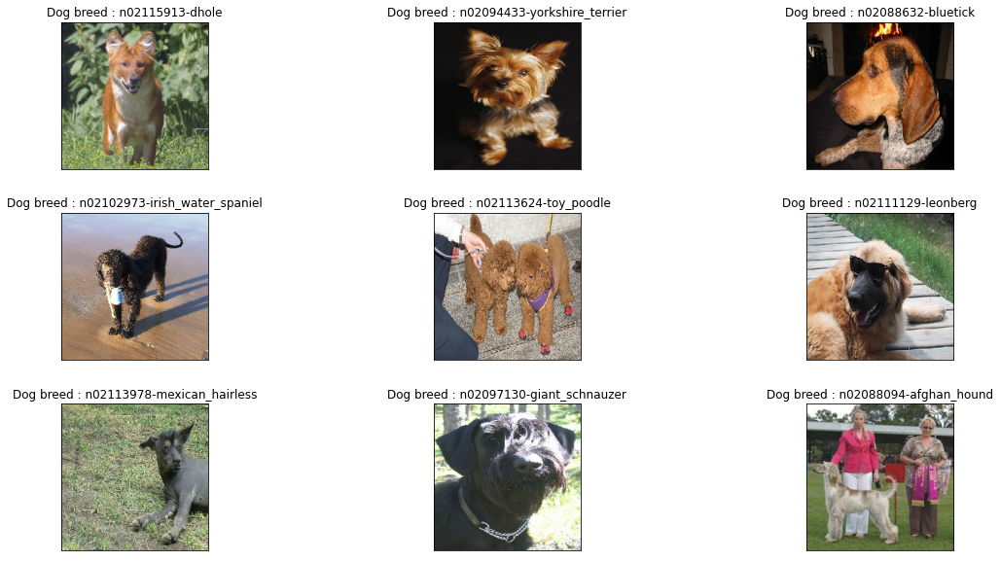

In [7]:
# just displaying images from the data set
def display_images(dogs_train):
  plt.figure(1 , figsize = (19 , 10))
  n = 0 
  for pic, label in prepare(dogs_train):
    n += 1 
    plt.subplot(3 , 3 , n)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(pic)
    plt.title('Dog breed : {}'.format(decode(label))) # notice the label decoding 
    plt.xticks([])
    plt.yticks([])
  plt.show()

display_images(dogs_train.take(9)) # only 9 images we can display more 

### Exercise 1: Implement a custom object (5 points)

**DESCRIPTION OF THE CODE**: 
I have selected regulizer method L1, L2 and L1_l2 regularizer but we haven't done custom implementation of it.

I took insights from two different resources [tensoflow implementation](https://github.com/tensorflow/tensorflow/blob/v2.4.1/tensorflow/python/keras/regularizers.py#L295-L325) and [towards science](https://towardsdatascience.com/how-to-implement-custom-regularization-in-tensorflow-keras-4e77be082918) blog implementation as well. I have changed the implementation around it. I have used original blogs of tensorflow documentation to see how to use them properly.  

L1 (Least Absolute Shrinkage and Selection Operator) adds “absolute value of magnitude” of coefficient as penalty term to the loss function.

L2 regularization penalizes weight values. For both small weight values and relatively large ones, L2 regularization transforms the values to a number close to 0, but not quite 0.
L2 penalizes the sum of the square of the weights (weight²), therefore we will be implementing this logic in a tensorflow regulizer class. 

l1_l2 regularizer(Elastic Net Regularization) just a combined sum of l1 and l2

In [8]:
# my custom implemnetation of the component
# tf.square is taking the squares of weights
# tf.abs(weights) is taking absolute
l1_regularization_factor = 0.01
l2_regularization_factor = 0.01

def l1_regularizer(weights): # functional implementation 
    return tf.reduce_sum(l1_regularization_factor * tf.abs(weights))  

def l2_regularizer(weights):  # functional implementation
    return tf.reduce_sum(l2_regularization_factor * tf.square(weights))   

def l1_l2_regularizer(weights):  # functional implementation
    return tf.reduce_sum((l1_regularization_factor * tf.abs(weights))) +  tf.reduce_sum(l2_regularization_factor * tf.square(weights)) # Elastic Net Regularization


In [9]:
@tf.keras.utils.register_keras_serializable(package='MyCustomPackage', name='l1') #  object oriented implementation by extending the base class
# Registration is required for Keras model_to_estimator, saving and loading models to HDF5 formats

class L1Regularizer(tf.keras.regularizers.Regularizer):
  def __init__(self, l1=0.01): # function used to initialize values that class will be using or simply a constructor in tensorflow
    self.l1 = l1

  def __call__(self, x):
    return self.l1 * tf.math.reduce_sum(tf.math.abs(x))

  def get_config(self):
    return {'l1': float(self.l1)}

In [10]:
@tf.keras.utils.register_keras_serializable(package='MyCustomPackage', name='l2') # object oriented implementation by extending the base class
# Registration is required for Keras model_to_estimator, saving and loading models to HDF5 formats
class L2Regularizer(tf.keras.regularizers.Regularizer):
  def __init__(self, l2=0.01):
    self.l2 = l2

  def __call__(self, x):
    return self.l2 * tf.math.reduce_sum(tf.math.square(x))

  def get_config(self):
    return {'l2': float(self.l2)}

In [11]:
@tf.keras.utils.register_keras_serializable(package='MyCustomPackage', name='l1_l2')
class L1_L2_Regularizer(tf.keras.regularizers.Regularizer):
  def __init__(self, l1=0.01, l2=0.01 ): # function used to initialize values that class will be using or simply a constructor in tensorflow
    self.l1 = l1
    self.l2 = l2

  def __call__(self, x):
    return (self.l1 * tf.math.reduce_sum(tf.math.abs(x))) + (self.l2 * tf.math.reduce_sum(tf.math.square(x)))

  def get_config(self):
    return {'l1': float(self.l1), 'l2': float(self.l2)}

In [12]:
# Initializing the layers for the component
layer1 = tf.keras.layers.Dense(
  10, input_dim=10, kernel_initializer='ones',
  kernel_regularizer = L2Regularizer(l2=l2_regularization_factor))

In [13]:
layer2 = tf.keras.layers.Dense(
  5, input_dim=5, kernel_initializer='ones',
  kernel_regularizer = L1Regularizer(l1=l1_regularization_factor))

layer3 = tf.keras.layers.Dense(
  3, input_dim=3, kernel_initializer='ones',
  kernel_regularizer = L1_L2_Regularizer(l2=l2_regularization_factor,l1=l1_regularization_factor))

In [14]:
tensor1 = tf.ones(shape=(10, 10)) # starting point for layer
tensor2 = tf.ones(shape=(5, 5))
tensor3 = tf.ones(shape=(3, 3))

In [15]:
out1 = layer1(tensor1)
layer1.losses

[<tf.Tensor: shape=(), dtype=float32, numpy=1.0>]

In [16]:
out2 = layer2(tensor2)
layer2.losses

[<tf.Tensor: shape=(), dtype=float32, numpy=0.25>]

In [17]:
out3 = layer3(tensor3)
layer3.losses

[<tf.Tensor: shape=(), dtype=float32, numpy=0.17999999>]

### Exercise 2: Train on your data (5 points)

### Build the model
I have used a pretrained model for object classification. I have attached a custom layers on top of it and train it for the task of dog breed recognition!

Why I have used pretained model? I am going to use the transfer learning technique so, started with (224, 224, 3) shape to build the model as it requires by [MobileNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/mobilenet/MobileNet) itself. Also, notice that I am using pretrained model imagenet. This whole methodology is called tranfer learning. Which is based on the idea that solving one problem and applying it to a different but related problem. For example, knowledge gained while learning to recognize cars could apply when trying to recognize trucks.

In [18]:
base_model = tf.keras.applications.MobileNetV2(input_shape = IMG_SHAPE, # here I am providing the shape because included_top is False
                                               include_top=False,
                                               weights='imagenet')
# I am using MobileNetV2 because I am going to save it later

In [19]:
base_model.summary() 

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

Just looking at the base model we see there are tons of layers stacked and total params are 2,257,984 from which Trainable parameters are 2,223,872 and 
Non-trainable parameters are 34,112.  we will add just two layers: a GlobalAveragePooling2D layer in order to transform the above-mentioned 7×7×1280
tensor into a vector, and then a single dense layer with as many neurons as the output classes we want to predict (i.e., the number of dog breeds).

In [20]:
base_model.trainable = False # notice that I am saying that I don't want to train base model and freezing the base model

model = tf.keras.Sequential([
  base_model,
  tf.keras.layers.GlobalAveragePooling2D(), # just added GlobalAveragePooling2D 
  tf.keras.layers.Dense(N_BREEDS, activation='softmax', kernel_regularizer =  L2Regularizer(l2=l2_regularization_factor) ) # notice that I am using custom L2Regulizer that I have done the implementation of
])

In [21]:
model.compile(optimizer=tf.keras.optimizers.Adamax(0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy','top_k_categorical_accuracy'])

In [22]:
model.summary() # below is the summary for later model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 120)               153720    
Total params: 2,411,704
Trainable params: 153,720
Non-trainable params: 2,257,984
_________________________________________________________________


### Training and testing the model

In [23]:
from tensorflow.keras import losses, optimizers, metrics, callbacks
from tensorflow.keras.callbacks import EarlyStopping
import datetime, os
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [24]:
full_dataset= prepare(dogs_train, batch_size=32)

In [25]:
DATASET_SIZE = len(full_dataset)

In [26]:
train_size = int(0.75 * DATASET_SIZE) # splitting the data between train and validation batches
val_size = int(0.25 * DATASET_SIZE)

train_batches = full_dataset.take(train_size)
validation_batches = full_dataset.skip(train_size).take(val_size)

In [27]:
# Below is the code for building the tensorboard callback
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) 
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [28]:
# customized implementation of early stopping
customized_early_stopping = EarlyStopping(
    monitor='val_accuracy', 
    patience=8, 
    min_delta=0.001, 
    mode='max'
)

In [29]:
history = model.fit(train_batches,
                    epochs= 30,
                    validation_data = validation_batches,
                    validation_freq=1,
                    callbacks=[tensorboard_callback,  customized_early_stopping ])

Epoch 1/30
281/281 [==============================] - 41s 131ms/step - loss: 7.0243 - accuracy: 0.0224 - top_k_categorical_accuracy: 0.0859 - val_loss: 6.5070 - val_accuracy: 0.0595 - val_top_k_categorical_accuracy: 0.1902.0711 - acc - ETA: 0s - loss: 7.0310 - accuracy: 0.0221 - top_k_categorical_accurac
Epoch 2/30
281/281 [==============================] - 36s 123ms/step - loss: 6.3644 - accuracy: 0.0788 - top_k_categorical_accuracy: 0.2467 - val_loss: 6.0929 - val_accuracy: 0.1294 - val_top_k_categorical_accuracy: 0.3525
Epoch 3/30
281/281 [==============================] - 36s 123ms/step - loss: 5.9492 - accuracy: 0.1520 - top_k_categorical_accuracy: 0.4095 - val_loss: 5.7272 - val_accuracy: 0.2080 - val_top_k_categorical_accuracy: 0.5060- loss: 5.9677 - accuracy: 0.1471 - top_k_categorical_ac - ETA: 3s - loss: 5.9639 - a
Epoch 4/30
281/281 [==============================] - 36s 125ms/step - loss: 5.5923 - accuracy: 0.2416 - top_k_categorical_accuracy: 0.5668 - val_loss: 5.4161 - va

281/281 [==============================] - 37s 128ms/step - loss: 2.4834 - accuracy: 0.8030 - top_k_categorical_accuracy: 0.9788 - val_loss: 2.6046 - val_accuracy: 0.7423 - val_top_k_categorical_accuracy: 0.9560


We can see that our model accuracy is **80%** and if we included categorical accuracy our model accuracy becomes **97%** I have plot matrices between training accuracy and validation accuracy. Then I plot the metrices between training loss and validation loss. 

In [31]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

def plot_metric(history, metric):
    train_metrics = history.history[metric]
    val_metrics = history.history['val_'+metric]
    epochs = range(1, len(train_metrics) + 1)
    plt.plot(epochs, train_metrics)
    plt.plot(epochs, val_metrics)
    plt.title('Training and validation '+ metric)
    plt.xlabel("Epochs")
    plt.ylabel(metric)
    plt.legend(["train_"+metric, 'val_'+metric])
    plt.show()

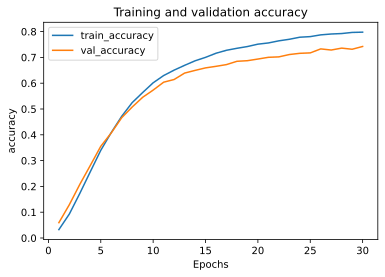

In [32]:
plot_metric(history, 'accuracy') 

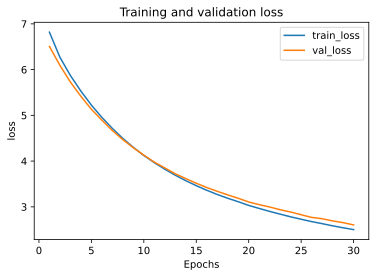

In [33]:
plot_metric(history, 'loss')

In [34]:
%tensorboard --logdir logs
# here I am just opening the tensorboard graphs within the jupyter notebook

ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 22088.

In [34]:
model.evaluate( prepare(dogs_test, batch_size=32)) # here I am evaluating the our model against testing data

269/269 [==============================] - 18s 64ms/step - loss: 2.6327 - accuracy: 0.7381 - top_k_categorical_accuracy: 0.9509 5s - loss: 2.6409 - accuracy: 0.7355 - top_k_categorical_accuracy: 0.94 


[2.6327033042907715, 0.7381119132041931, 0.9509323835372925]

Model didn't performed too much bad its still giving **73%** accuracy on test data and **94%** accuracy on top_k_categorical_accuracy. Lets save our model for now. 

In [35]:
model.save("dogs_classifier_trained_model.h5") # I might use it later. 10mb size not too much bad maybe I will use it for mobile application

For now on I am just testing the model how it will perform in real life images got from internet.

In [42]:
# Downloading and saving random images to test 
import os
import requests
import time
from pathlib import Path
import json
from types import SimpleNamespace
import re
import random


url = 'https://dog.ceo/api/breeds/image/random/50' # url where I am downloading images
headers = { 'Content-type': 'application/json'}
r = requests.get(url, headers = headers)
x = json.loads(r.text, object_hook=lambda d: SimpleNamespace(**d))
random.shuffle(x.message) # just another shuffling
random_dogs = x.message[:9]

base_url = 'RandomDogs'
base_path = Path(base_url)

if base_path.is_dir() != True :
  os.mkdir(base_url)

# saving original breed

random_dogs_labels = []
# breed should be after breeds/komondor/
for item in random_dogs:
  result = re.search('breeds/(.*)/', item)
  # print(result.group(1))
  random_dogs_labels.append(result.group(1))


i = 0
for url in random_dogs:
# just to download the image
  img_data = requests.get(url).content
  ts = time.time()
  file_name = base_url + "/" + random_dogs_labels[i] +"-" + str(ts) + ".jpg"
  with open(file_name, 'wb') as handler:
      handler.write(img_data)
  i = i + 1


In [43]:
# for displaying the random images and lables downloaded
def display_image_label(images, labels):
  plt.figure(1 , figsize = (19 , 10))
  n = 0
  i = 0 
  for pic in images:
    label = labels[n]
    n += 1 
    plt.subplot(3 , 3 , n)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(pic)
    plt.title('Dog breed : {}'.format(label))
    plt.xticks([])
    plt.yticks([])
  plt.show()

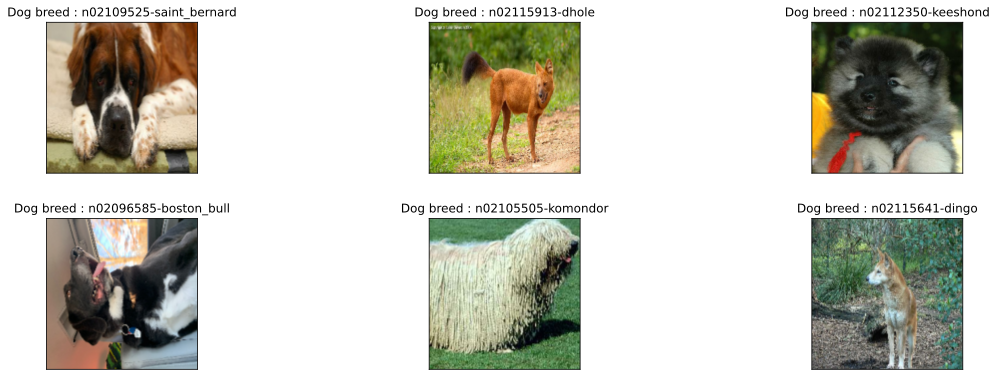

In [44]:
# this code is used for testing the model got from internet and predicting its label 
filename_dataset = tf.data.Dataset.list_files( base_url +"/*.jp*g")
image_dataset = filename_dataset.map(lambda x: tf.io.decode_jpeg(tf.io.read_file(x)))

images = []
predicted_labels = []  # will save predicted labels
top_matched_labels = [] # will save near or top 5 nearest breeds

for dog in image_dataset:

  mock_dict = {'image': dog, 'label': 0}
  pic, _ = preprocess(mock_dict)
  
  images.append(pic)
  img_tensor = tf.expand_dims(pic,0)
  pred = model(img_tensor)
  
  top_components = tf.reshape(tf.math.top_k(pred, k=5).indices,shape=[-1])
  top_matches = [get_name(i) for i in top_components]

  predicted_labels.append(top_matches[0])
  top_matched_labels.append(top_matches)

display_image_label(images[:6], predicted_labels[:6]) # for now cannot go more than that


Looking at above images and scanning it on internet this is the result:
1. Saint Bernard - CORRECT 
2. Dhole - CORRECT 
3. Keeshond - CORRECT
4. Boston Bull - MAYBE
5. Komondor- CORRECT
6. Dingo - CORRECT 


Lets just print out breed I got from internet and model predicted breeds. Seems pretty close



In [45]:
index = 0
for name_of_orginal_pic in filename_dataset.take(6):
  tf.print("Original Breed: " + name_of_orginal_pic) # its a bad idea because naming is not the same but lets do that
  print( "Predicted Labels: " + str(top_matched_labels[index]) )
  index+=1

Original Breed: RandomDogs\keeshond-1631505392.1605031.jpg
Predicted Labels: ['n02109525-saint_bernard', 'n02086646-blenheim_spaniel', 'n02107574-greater_swiss_mountain_dog', 'n02102040-english_springer', 'n02108089-boxer']
Original Breed: RandomDogs\dingo-1631505386.8317604.jpg
Predicted Labels: ['n02115913-dhole', 'n02115641-dingo', 'n02110806-basenji', 'n02105162-malinois', 'n02112706-brabancon_griffon']
Original Breed: RandomDogs\retriever-curly-1631505388.9843004.jpg
Predicted Labels: ['n02112350-keeshond', 'n02112018-pomeranian', 'n02104365-schipperke', 'n02112137-chow', 'n02091467-norwegian_elkhound']
Original Breed: RandomDogs\hound-plott-1631505388.2954578.jpg
Predicted Labels: ['n02096585-boston_bull', 'n02113186-cardigan', 'n02108915-french_bulldog', 'n02106166-border_collie', 'n02093256-staffordshire_bullterrier']
Original Breed: RandomDogs\dhole-1631505389.845019.jpg
Predicted Labels: ['n02105505-komondor', 'n02106382-bouvier_des_flandres', 'n02105251-briard', 'n02091635-o

### Exercise 3 (5 points)
 

**DESCRIPTION OF THE CODE**: I have used [adversarial-robustness-toolbox](https://github.com/Trusted-AI/adversarial-robustness-toolbox) for adversaral attack. I have used **Fast gradient sign method** for attacking the model  I have seen as values of epsilon increase model still provide prediction of the jibrish imagaes. However, this comes as a trade-off which results in the perturbations becoming more identifiable. After that I applied Spatial Smoothing to recover from that attack. 


Looking at the [code sample](https://github.com/Trusted-AI/adversarial-robustness-toolbox/blob/main/examples/get_started_tensorflow_v2.py) and watching [this](https://www.youtube.com/watch?v=tTN_BqTv440&ab_channel=PyConUK) amazing video on youtube helped alot to understand how perturbation works. 

Point to note that, I have used the pretrained model above and it works. For adversarial attack I had to get numpy images for that I have written the code to convert the images to numpy images. 

I have also, decreased the images from float32 to float16.

This training step is being used for [TensorFlow v2 Classifier](https://adversarial-robustness-toolbox.readthedocs.io/en/latest/modules/estimators/classification.html#tensorflow-v2-classifier) as it is require by toolbox implementation

In [87]:
loss_object = tf.keras.losses.CategoricalCrossentropy() # it is required for TensorFlowV2Classifier

In [88]:
# just loading my pretrained model which I have saved above
saved_model = tf.keras.models.load_model('dogs_classifier_trained_model.h5')
# Checking its architecture
saved_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d (Gl (None, 1280)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 120)               153720    
Total params: 2,411,704
Trainable params: 153,720
Non-trainable params: 2,257,984
_________________________________________________________________


In [89]:
# revaluting to check it is loaded properly
saved_model.evaluate(prepare(dogs_test, batch_size=32)) # here I am evaluating the our model against testing data

269/269 [==============================] - 19s 63ms/step - loss: 2.6450 - accuracy: 0.7268 - top_k_categorical_accuracy: 0.9512 11s - loss: 2.6634 - accuracy: 0.7250 -  - ETA: 9s - loss: 2.6616 - accuracy: 0.7254 - top_k_categorical_accuracy: 0.94 - ETA: 


[2.644993782043457, 0.7268065214157104, 0.951165497303009]

In [90]:
classifier = TensorFlowV2Classifier(
    model=saved_model,
    nb_classes= N_BREEDS,
    loss_object = loss_object,
    input_shape= (224,224,3),
    clip_values=(0, 1),
)

Below code, Firstly I am checking how can we get the numpy array's of images and one hot encoded labels. And after that I am just utalizing algorithm that is getting the images(224,224,3) from the dataset one by one and stacking them up in array for later conversion into (NUM_OF_ITEMS, 224, 224,3) numpy ndarray. Notice that we can specify. NUM_OF_ITEMS in below code can be any number of images. Also, notice that labels and images first dimension meaning number of length should be same otherwise it will accept the dataset of images and labels. 

eg: IMAGES: (NUM_OF_ITEMS, 224, 224, 3) LABEL: (3000, 120)

In [91]:
import numpy as np
#load dataset in to numpy array
items  = prepare(dogs_train.take(1))
items = tfds.as_numpy(items)

for ex in items:
    print(ex[0].shape)
    print(ex[1].shape)


(224, 224, 3)
(120,)


In [92]:
NUM_OF_ITEMS = 500
IMAGE_LENGTH = 224

In [93]:
def preprocess_numpy(ds_row):
  
    # Image conversion int->float + resizing
    image = tf.image.convert_image_dtype(ds_row['image'], dtype=tf.float16) # conversion to float 32
    image = tf.image.resize(image, (IMAGE_LENGTH, IMAGE_LENGTH),  method='nearest') # reszing the image to 224 
    # Onehot encoding labels
    label = tf.one_hot(ds_row['label'],N_BREEDS) # one hot encoding of the breeds for later usage IMPORTANT

    return image, label

def prepare_numpy(dataset, batch_size=None):
    
    ds = dataset.map(preprocess_numpy, num_parallel_calls=4) # notice calling of preprocess
    ds = ds.shuffle(buffer_size=1000) # shuffling the data 
    
    if batch_size:
        ds = ds.batch(batch_size) # if sent specific batch size 
        ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE) # prefetching as used in labs 
    
    return ds

In [95]:
def get_numpy_images(items, num_of_items= NUM_OF_ITEMS):  
    x_images = [] 
    y_labels = []

    n_items  = prepare_numpy(items.take(num_of_items))
    n_items = tfds.as_numpy(n_items)

    i = 0;
    for item in n_items:
        x_images = np.append(x_images, np.asarray( item[0], dtype='float16' ))
        y_labels = np.append(y_labels,  item[1] )
        
    x_images = np.reshape( np.array(x_images),(num_of_items,IMAGE_LENGTH,IMAGE_LENGTH,CHANNELS))
    y_labels = np.reshape( np.array(y_labels), (num_of_items, N_BREEDS))
    
    return x_images, y_labels

x_test_images, y_test_labels = get_numpy_images(dogs_test)
print(x_test_images.shape)
print(y_test_labels.shape)

(500, 224, 224, 3)
(500, 120)


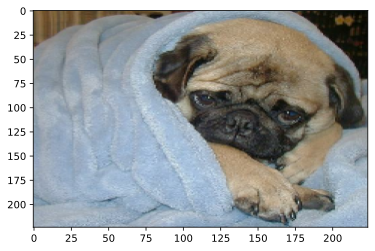

In [96]:
# testing the image whether we stored it correctly or not
plt.imshow(x_test_images[1,:, :, :],aspect="auto") # notice that I am only displaying first images from stacked 
plt.show()

In [97]:
# model is already trained so, I am just testing it on numpy images and getting accuracy not too much necessary step can be 
# ignored
predictions = classifier.predict(x_test_images, batch_size=32)
accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test_labels, axis=1)) / len(y_test_labels)

# Checking accuracy 
x_test_adv_pred = np.argmax(classifier.predict(x_test_images), axis=1)
nb_correct_adv_pred = np.sum(x_test_adv_pred == np.argmax(y_test_labels, axis=1))

print("Adversarial test data (first "+ str(NUM_OF_ITEMS)+ " images):")
print("Correctly classified: {}".format(nb_correct_adv_pred))
print("Incorrectly classified: {}".format(NUM_OF_ITEMS-nb_correct_adv_pred))
print("Accuracy on benign test examples overall on all the images: {}%".format(accuracy * 100))

Adversarial test data (first 500 images):
Correctly classified: 364
Incorrectly classified: 136
Accuracy on benign test examples overall on all the images: 72.8%


In [98]:
epsilons = [
            0.005, 0.01, 0.015, 0.020, 0.025, 0.030, 0.035
]

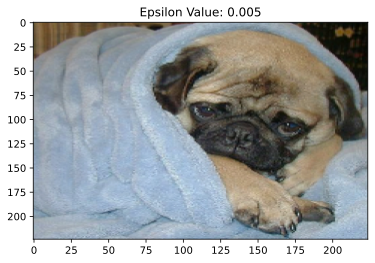

Adversarial test data (first 500 images):
Correctly classified: 46
Incorrectly classified: 454
Accuracy on adversarial images: 9.2%


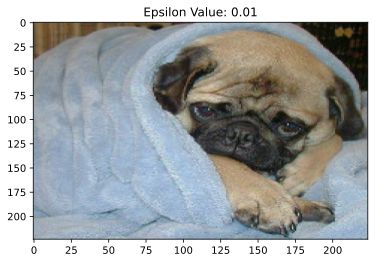

Adversarial test data (first 500 images):
Correctly classified: 31
Incorrectly classified: 469
Accuracy on adversarial images: 6.2%


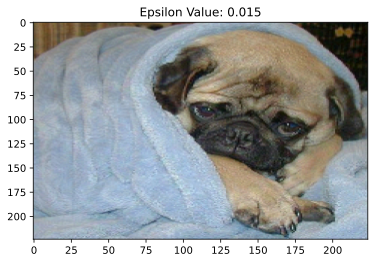

Adversarial test data (first 500 images):
Correctly classified: 23
Incorrectly classified: 477
Accuracy on adversarial images: 4.6%


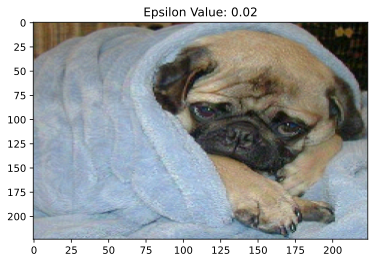

Adversarial test data (first 500 images):
Correctly classified: 24
Incorrectly classified: 476
Accuracy on adversarial images: 4.8%


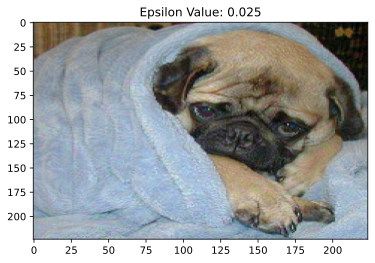

Adversarial test data (first 500 images):
Correctly classified: 23
Incorrectly classified: 477
Accuracy on adversarial images: 4.6%


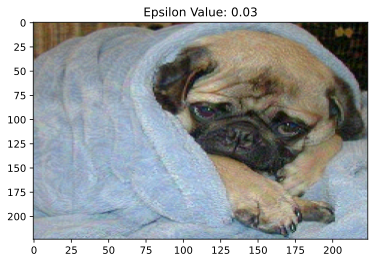

Adversarial test data (first 500 images):
Correctly classified: 23
Incorrectly classified: 477
Accuracy on adversarial images: 4.6%


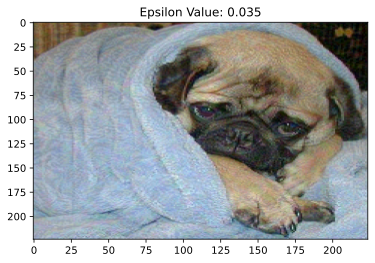

Adversarial test data (first 500 images):
Correctly classified: 24
Incorrectly classified: 476
Accuracy on adversarial images: 4.8%


In [99]:
for epsilon in epsilons:
    
    # Generating FastGradientMethod attack
    attack = FastGradientMethod(estimator=classifier, eps=epsilon, batch_size=32)
    x_test_adv = attack.generate(x = x_test_images)
    plt.imshow(x_test_adv[1,:, :, :],aspect="auto")
    plt.title("Epsilon Value: " + str(epsilon))
    plt.show()
    # Evaluate the ART classifier on adversarial test images

    predictions = classifier.predict(x_test_adv, batch_size=32)
    accuracy = np.sum(np.argmax(predictions, axis=1) == np.argmax(y_test_labels, axis=1)) / len(y_test_labels)
    # Checking accuracy 
    x_test_adv_pred = np.argmax(predictions, axis=1)
    nb_correct_adv_pred = np.sum(x_test_adv_pred == np.argmax(y_test_labels, axis=1))


    print("Adversarial test data (first "+ str(NUM_OF_ITEMS)+ " images):")
    print("Correctly classified: {}".format(nb_correct_adv_pred))
    print("Incorrectly classified: {}".format(NUM_OF_ITEMS-nb_correct_adv_pred))
    print("Accuracy on adversarial images: {}%".format(accuracy * 100))

Looking at above attack we can see that accuracy of model, If we increase the value of epsilon(perturbations) the accuracy is keep decresing even though images should be correctly classified atleast to the accuracy of model. 

### Defence againts Fast Gradient Method

Lets fetch first image and predict its breed from our trained model. 

In [122]:
image_dataset = dogs_test.take(1)

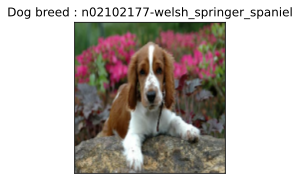

In [123]:
display_images(image_dataset)

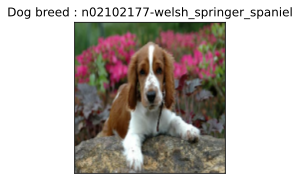

In [124]:
images = []
predicted_labels = []  # will save predicted labels
top_matched_labels = [] # will save near or top 5 nearest breeds


for dog, label in prepare(image_dataset):

    mock_dict = {'image': dog, 'label': 0}
    pic, _ = preprocess(mock_dict)

    images.append(pic)
    img_tensor = tf.expand_dims(pic,0)
    pred = saved_model(img_tensor)

    top_components = tf.reshape(tf.math.top_k(pred, k=5).indices,shape=[-1])
    top_matches = [get_name(i) for i in top_components]

    predicted_labels.append(top_matches[0])
    top_matched_labels.append(top_matches)

display_image_label(images, predicted_labels) # for now cannot go more than that

In [125]:
index = 0
for dog, label in prepare(image_dataset):
    tf.print("Original Breed: " + decode(label)) # its a bad idea because naming is not the same but lets do that
    print( "Predicted Labels: " + str(top_matched_labels[index]) )
    index+=1

Original Breed: n02102177-welsh_springer_spaniel
Predicted Labels: ['n02102177-welsh_springer_spaniel', 'n02088238-basset', 'n02102040-english_springer', 'n02102318-cocker_spaniel', 'n02086646-blenheim_spaniel']


Now, lets create an Fast Gradient Method attack to understand whether our model will be able to predict correct breeds or not. 

In [126]:
x_test_images, y_test_labels = get_numpy_images(image_dataset, 1)

In [129]:
eps = 0.03 # this is right perbutation that image can recover using Spatial Smoothing

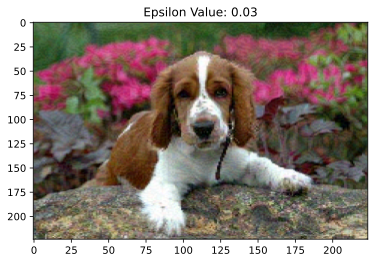

In [130]:
# Generating FastGradientMethod attack
attack = FastGradientMethod(estimator=classifier, eps=eps, batch_size=1)
x_test_adv_image = attack.generate(x = x_test_images[0:1,:, :, :])


plt.imshow(x_test_adv_image[0],aspect="auto")
plt.title("Epsilon Value: " + str(eps))
plt.show()

mock_dict = {'image': x_test_adv_image[0], 'label': 0}

img_tensor = tf.expand_dims( x_test_adv_image[0],0)
pred = saved_model(img_tensor)

top_components = tf.reshape(tf.math.top_k(pred, k=5).indices,shape=[-1])
top_matches = [get_name(i) for i in top_components]


In [131]:
index = 0
for dog, label in prepare(image_dataset):
    tf.print("Original Breed: " + decode(label)) # its a bad idea because naming is not the same but lets do that
    print( "Predicted Labels: " + str(top_matches[index]) )
    print( "Predicted Percentages: " + str(top_components[index]) )
    index+=1

Original Breed: n02102177-welsh_springer_spaniel
Predicted Labels: n02109525-saint_bernard
Predicted Percentages: tf.Tensor(96, shape=(), dtype=int32)


From above attack we can see that model is not able to predict the breed properly.

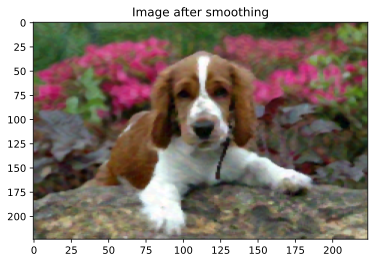

In [132]:
filtered_adversarial_image, labels = SpatialSmoothingTensorFlowV2(window_size=3, channels_first=False)( x_test_adv_image[0:1,:, :, :])

plt.imshow(filtered_adversarial_image[0],aspect="auto")
plt.title("Image after smoothing")
plt.show()

mock_dict = {'image': filtered_adversarial_image[0], 'label': 0}

img_tensor = tf.expand_dims( filtered_adversarial_image[0],0)
pred = saved_model(img_tensor)

top_components = tf.reshape(tf.math.top_k(pred, k=5).indices,shape=[-1])
top_matches = [get_name(i) for i in top_components]

In [133]:
index = 0
for dog, label in prepare(image_dataset):
    tf.print("Original Breed: " + decode(label)) # its a bad idea because naming is not the same but lets do that
    print( "Predicted Labels: " + str(top_matches[index]) )
    print( "Predicted Percentages: " + str(top_components[index]) )
    index+=1

Original Breed: n02102177-welsh_springer_spaniel
Predicted Labels: n02102177-welsh_springer_spaniel
Predicted Percentages: tf.Tensor(67, shape=(), dtype=int32)


To conclude that Spatial Smoothing act as defence mechanism against Fast Gradient Method. 

### **REFERENCES:**


**Kaggle:**
1. [Dog images classification using Keras](https://www.kaggle.com/msripooja/dog-images-classification-using-keras-alexnet)
2. [Stanford Dogs Dataset](https://https://www.kaggle.com/jessicali9530/stanford-dogs-dataset/code?datasetId=119698&sortBy=voteCount)
3. [dog-breeds-classifier](https://)https://www.kaggle.com/hengzheng/dog-breeds-classifier
4. [stanford-dogs-keras-vgg16](https://https://www.kaggle.com/twhitehurst3/stanford-dogs-keras-vgg16/comments)

**Articles:**
1. [Dog Breed Classification](https://www.angioi.com/dog-breed-classification/)
2.[Tensorflow Adversarial FGSM]( https://www.tensorflow.org/tutorials/generative/adversarial_fgsm)
3. [Implementing AlexNet CNN Architecture Using TensorFlow 2.0+ and Keras](https://towardsdatascience.com/implementing-alexnet-cnn-architecture-using-tensorflow-2-0-and-keras-2113e090ad98) 
4. [Early Stopping ]( https://towardsdatascience.com/a-practical-introduction-to-early-stopping-in-machine-learning-550ac88bc8fd)

**Notebooks:**
1. [TensorBoard](https://colab.research.google.com/github/tensorflow/tensorboard/blob/master/docs/tensorboard_in_notebooks.ipynb#scrollTo=lpUO9HqUKP6z )

**Useful Links:**
1. [Youtube Video For ART(Adversarial Roubstness Attack)](https://www.youtube.com/watch?v=tTN_BqTv440&ab_channel=PyConUK)
2. [Random Fetching Dogs Website)](https://dog.ceo/dog-api/documentation/random) 

**Github Links:**

1. [Main Link For ART](https://github.com/Trusted-AI/adversarial-robustness-toolbox)
2. [Machine Learning Useful Toturials](https://github.com/BindiChen/machine-learning)
3. [Tensorflow ART Toturial](https://github.com/Trusted-AI/adversarial-robustness-toolbox/blob/main/examples/get_started_tensorflow_v2.py)
5. [Early Stopping Github Link](https://github.com/BindiChen/machine-learning/blob/master/tensorflow2/005-early-stopping/early-stopping.ipynb)

**Documentation:**
1. [Adversarial  Robustness Toolbox Tensoflow Classifier Class](https://adversarial-robustness-toolbox.readthedocs.io/en/latest/modules/estimators/classification.html#tensorflow-v2-classifier)
2. [Dataset Standford Dogs](https://www.tensorflow.org/datasets/catalog/stanford_dogs)
3. [Minst Dataset to get insight about stacking Images](https://www.tensorflow.org/api_docs/python/tf/keras/datasets/mnist/load_data)